# Foraging toolkit demo - hungry foragers

## Outline
* [Introduction](#introduction)
* [Simulation](#simulation)
* [Derived quantities](#derived-quantities)
* [Inference](#inference)

## Introduction

In this notebook we use the foraging toolkit to simulate agents that move toward food.

_The users are advised to familiarize themselves with the [random_foragers.ipynb](./random_foragers.ipynb) demo, which contains detailed explanation of the various commands._

The main reference is [1], in particular Fig.2.

---

[1] R. Urbaniak, M. Xie, and E. Mackevicius, “Linking cognitive strategy, neural mechanism, and movement statistics in group foraging behaviors,” Sci Rep, vol. 14, no. 1, p. 21770, Sep. 2024, [doi: 10.1038/s41598-024-71931-0.](https://www.nature.com/articles/s41598-024-71931-0)

In [1]:
# importing packages. See https://github.com/BasisResearch/collab-creatures for repo setup
import logging
import os
import random
import time

import dill
import matplotlib.pyplot as plt
import numpy as np
import plotly.io as pio

pio.renderers.default = "notebook"


import collab.foraging.toolkit as ft
from collab.foraging import random_hungry_followers as rhf

logging.basicConfig(format="%(message)s", level=logging.INFO)

# users can ignore smoke_test -- it's for automatic testing on GitHub,
# to make sure the notebook runs on future updates to the repository
smoke_test = "CI" in os.environ
num_frames = 5 if smoke_test else 50
num_svi_iters = 10 if smoke_test else 1000
num_samples = 10 if smoke_test else 1000

notebook_starts = time.time()

## Simulation

Compared with the random agents simulation in `random_foragers.ipynb`, we'll  use more frames, and a larger gridworld environment. The simulation might take a bit longer, so we'll save it for future use.

**Simulation of hungry foragers**

Note that rewards have impact on agents' positions and therefore reward and trace updates are required at every step.

- **Initialization**
    - Initialize the grid with a specified grid size
    - Randomly place `num_rewards` rewards on the grid.
    - Normalize the probabilities for forager step size

- **Forward Simulation**
    - For each frame:
        - Remove any reward from the frame onwards if a forager is next to it
        - Compute food traces, i.e. additive scores for points in space-time, with exponential decay and maximum at 1 located at reward locations
        - For each forager:
            - Compute visibility for points in forager's range
            - Sort visible points by their current accumulated trace score
            - Move forager to a random position from the top 10 from the ranking above

In [2]:
random.seed(23)
np.random.seed(23)

# serialize hungry_sim using dill, as this simulation takes a bit of time
# if hungry sim not in folder, generate, otherwise load
always_generate = False

sim_file = os.path.join("sim_data", "hungry_sim.dill")

if not os.path.exists(sim_file) or always_generate:

    # create a new empty simulation (a starting point for the actual simulation)
    hungry_sim = rhf.Foragers(
        grid_size=60,
        num_foragers=3,
        num_frames=num_frames,
        num_rewards=60,
        grab_range=3,
    )

    hungry_sim()  # run the simulation: this places the rewards on the grid

    # add hungry foragers and run simulation forward
    hungry_sim = rhf.add_hungry_foragers(
        hungry_sim, num_hungry_foragers=3, rewards_decay=0.3, visibility_range=6
    )

    with open(sim_file, "wb") as f:
        dill.dump(hungry_sim, f)

else:
    print("Loading existing simulation results")
    with open(sim_file, "rb") as f:
        hungry_sim = dill.load(f)

# display(hungry_sim.foragersDF)

2024-10-28 14:01:03,751 - Generating frame 10/50 
2024-10-28 14:01:12,834 - Generating frame 20/50 
2024-10-28 14:01:20,240 - Generating frame 30/50 
2024-10-28 14:01:25,688 - Generating frame 40/50 


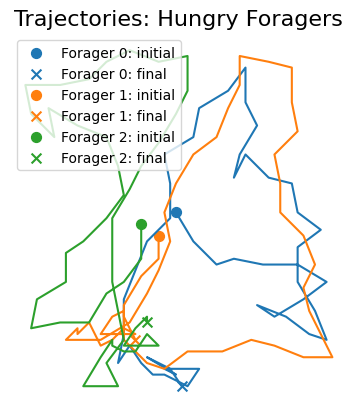

In [3]:
ft.plot_trajectories(hungry_sim.foragersDF, "Hungry Foragers")
plt.show()

We will use the `animate_foragers` function with `plot_traces=True` to show the values of the food traces at every grid point and each frame.

In [4]:
ft.animate_foragers(
    hungry_sim, width=600, height=400, plot_rewards=True, plot_traces=True, point_size=6
)

## Derived quantities

In [5]:
# We'll use `proximity`, `food` and `access` predictors

local_windows_kwargs = {
    "window_size": 10,
    "sampling_fraction": 1,
    "skip_incomplete_frames": False,
}

predictor_kwargs = {
    "proximity": {
        "interaction_length": hungry_sim.grid_size / 3,
        "interaction_constraint": None,
        "interaction_constraint_params": {},
        "repulsion_radius": 1.5,
        "optimal_distance": 4,
        "proximity_decay": 1,
    },
    "food": {
        "decay_factor": 0.5,
    },
    "access": {
        "decay_factor": 0.2,
    },
}

score_kwargs = {
    "nextStep_linear": {"nonlinearity_exponent": 1},
    "nextStep_sublinear": {"nonlinearity_exponent": 0.5},
}

derivedDF_hungry = ft.derive_predictors_and_scores(
    hungry_sim,
    local_windows_kwargs,
    predictor_kwargs=predictor_kwargs,
    score_kwargs=score_kwargs,
    dropna=True,
    add_scaled_values=True,
)

2024-10-28 14:01:31,635 - proximity completed in 0.29 seconds.
2024-10-28 14:01:32,257 - food completed in 0.62 seconds.
2024-10-28 14:01:32,361 - access completed in 0.10 seconds.
2024-10-28 14:01:32,509 - nextStep_linear completed in 0.15 seconds.
2024-10-28 14:01:32,590 - nextStep_sublinear completed in 0.08 seconds.
/Users/emily/code/collaborative-intelligence/collab/foraging/toolkit/derive.py:56: UserWarning:


                      Dropped 821/43128 frames from `derivedDF` due to NaN values.
                      Missing values can arise when computations depend on next/previous step positions
                      that are unavailable. See documentation of the corresponding predictor/score generating
                      functions for more information.
                      



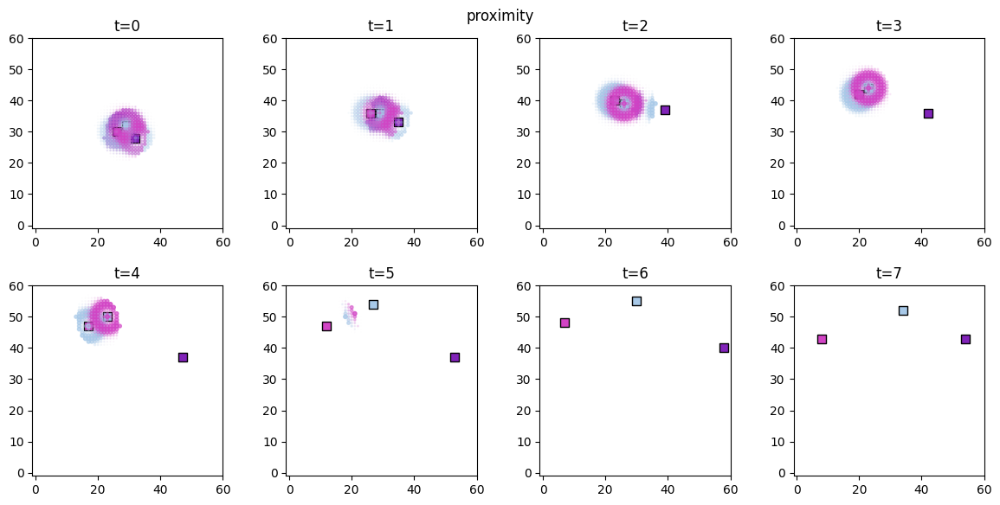

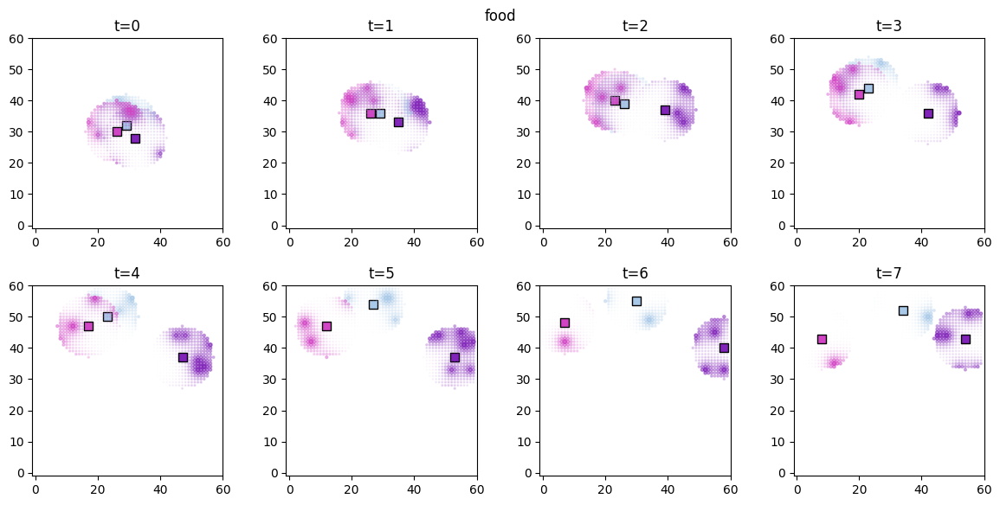

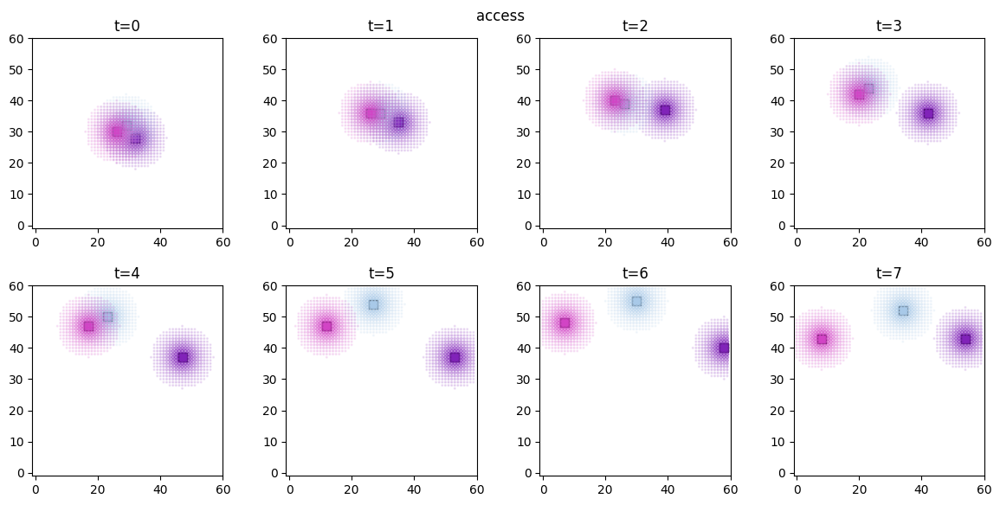

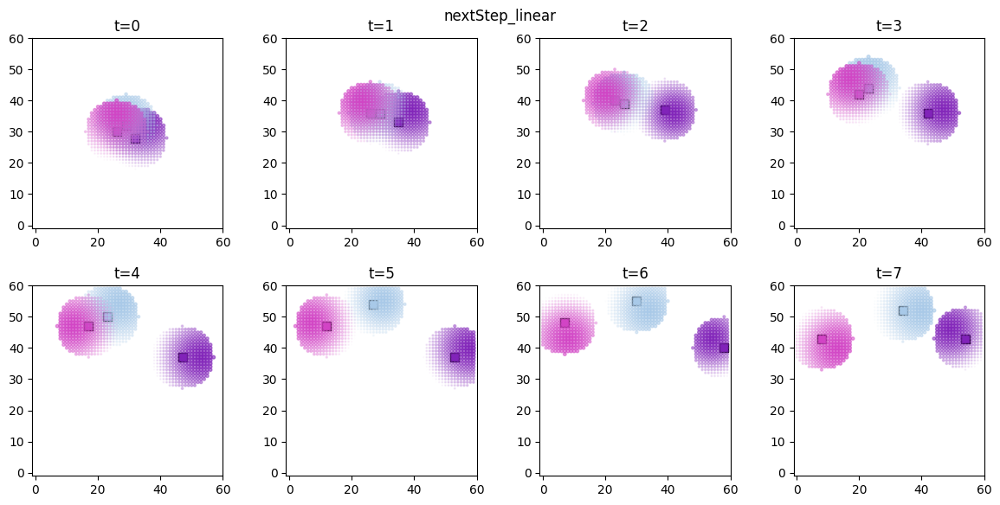

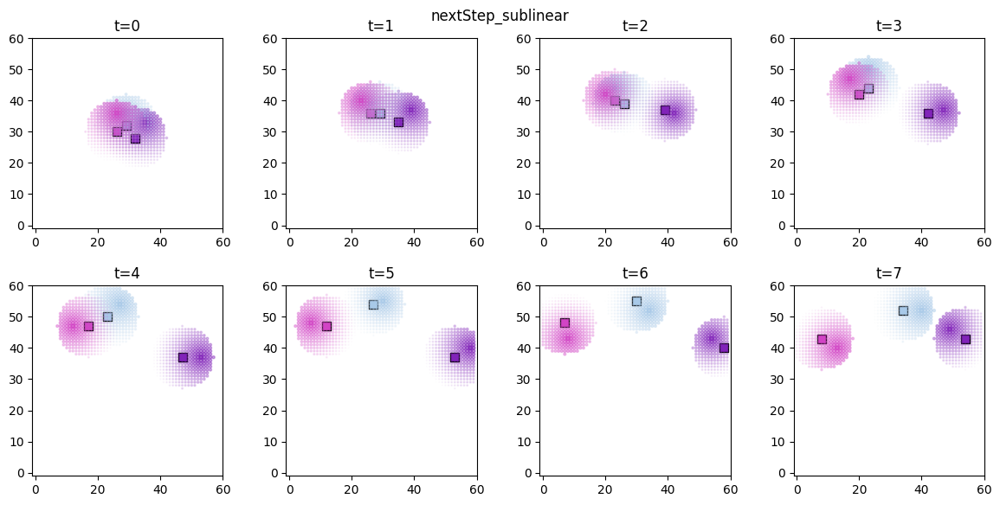

In [6]:
# visualize the spatial distributions of the derived quantities for each forager

for derived_quantity_name in hungry_sim.derived_quantities.keys():
    ft.plot_predictor(
        hungry_sim.foragers,
        hungry_sim.derived_quantities[derived_quantity_name],
        predictor_name=derived_quantity_name,
        time=range(min(8, num_frames)),
        grid_size=60,
        size_multiplier=10,
        random_state=99,
        forager_position_indices=[0, 1, 2],
        forager_predictor_indices=[0, 1, 2],
    )
    plt.suptitle(derived_quantity_name)
    plt.show()

## Inference

2024-10-28 14:01:35,249 - Sample size: 42307
2024-10-28 14:01:35,250 - Starting SVI inference with 1500 iterations.


[iteration 0001] loss: 158130.3125
[iteration 0200] loss: 104908.4688
[iteration 0400] loss: 103011.6641
[iteration 0600] loss: 102709.2344
[iteration 0800] loss: 102773.9375
[iteration 1000] loss: 102669.6719
[iteration 1200] loss: 102952.9688
[iteration 1400] loss: 102743.9531


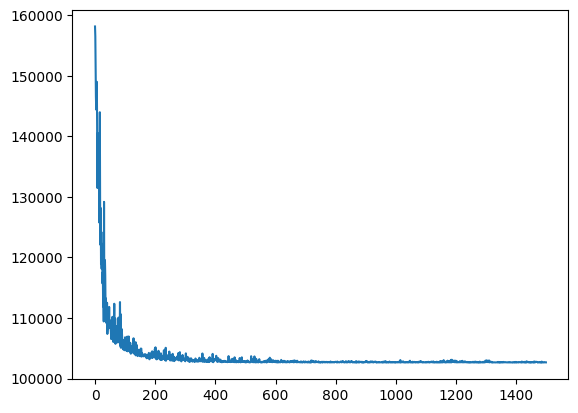

2024-10-28 14:01:44,620 - SVI inference completed in 9.37 seconds.


Coefficient marginals:
Site: weight_continuous_proximity_scaled_nextStep_sublinear
       mean       std        5%       25%       50%      75%       95%
0  0.062259  0.013569  0.039397  0.053392  0.062477  0.07096  0.085148 

Site: weight_continuous_food_scaled_nextStep_sublinear
      mean       std        5%       25%       50%       75%       95%
0  0.67286  0.016578  0.645184  0.662119  0.672819  0.684356  0.700079 

Site: weight_continuous_access_scaled_nextStep_sublinear
       mean       std        5%       25%       50%       75%       95%
0  0.514889  0.014533  0.489584  0.505649  0.515537  0.524791  0.538178 



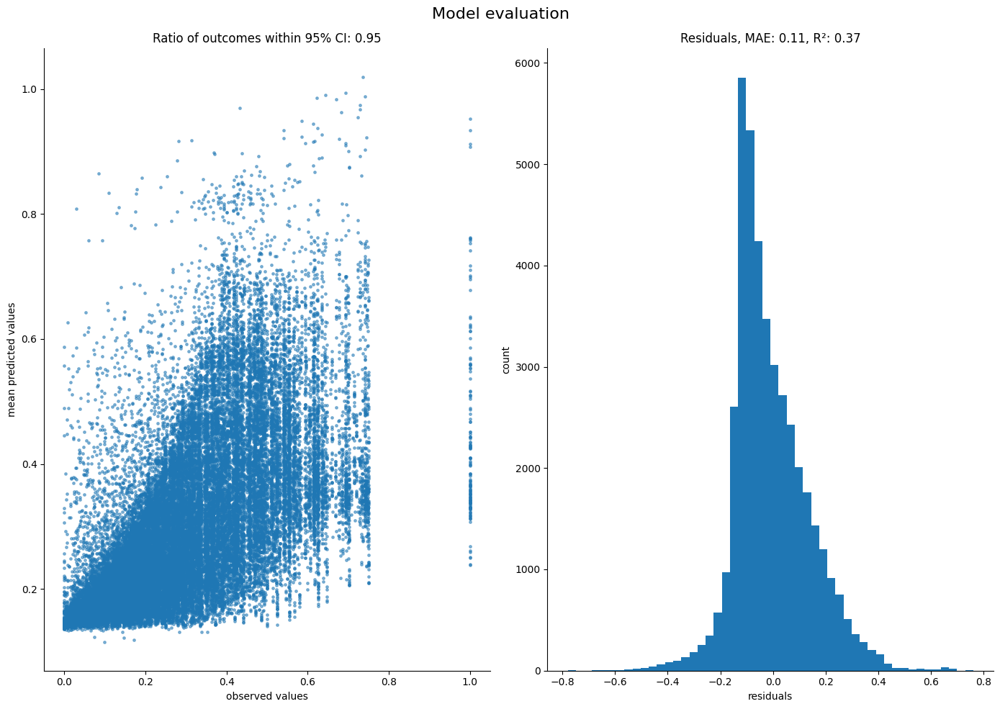

In [7]:
# prepare the training data

predictors = ["proximity_scaled", "food_scaled", "access_scaled"]
outcome_vars = ["nextStep_sublinear"]


predictor_tensors_hungry, outcome_tensor_hungry = ft.prep_data_for_inference(
    hungry_sim, predictors, outcome_vars
)

# construct Pyro model
model_sigmavar_hungry = ft.HeteroskedasticLinear(
    predictor_tensors_hungry, outcome_tensor_hungry
)

# runs SVI to approximate the posterior and samples from it
results_hungry = ft.get_samples(
    model=model_sigmavar_hungry,
    predictors=predictor_tensors_hungry,
    outcome=outcome_tensor_hungry,
    num_svi_iters=1500,
    num_samples=1000,
)

selected_sites = [
    key
    for key in results_hungry["samples"].keys()
    if key.startswith("weight") and not key.endswith("sigma")
]
selected_samples = {key: results_hungry["samples"][key] for key in selected_sites}

ft.plot_coefs(
    selected_samples, "Hungry foragers", nbins=120, ann_start_y=160, ann_break_y=50
)


# save the samples for future use
with open(os.path.join("sim_data", "hungry_foragers_samples.dill"), "wb") as f:
    dill.dump(selected_samples, f)

ft.evaluate_performance(
    model=model_sigmavar_hungry,
    guide=results_hungry["guide"],
    predictors=predictor_tensors_hungry,
    outcome=outcome_tensor_hungry,
    num_samples=1000,
)

As expected, both `access` and `food` are now significant in explaining the agent movements, while `proximity` has no effect.